In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import statsmodels.api as sm
import patsy
import scipy.stats as stats
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV, ElasticNet, ElasticNetCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

pd.set_option('display.max_columns', 75)
pd.set_option('display.max_rows', 100)

In [2]:
save_dir = r"C:\Users\minhp\PycharmProjects\SoFIFA\Data"
file_name = "cleaned_sofifa_players.csv"
file_path = os.path.join(save_dir, file_name)
df = pd.read_csv(file_path, encoding="utf-8")

In [3]:
df.sort_values(by='Value').tail(20)

,Player Name,Position,Age,Overall Rating,Potential,Team Contracts,ID,Height,Weight,Preferred foot,Best overall,Best Position,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Defendsive Awareness,Standing Tackle,Sliding Tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,international reputation,pace/diving,shooting/handling,passing/kicking,dribbling/positioning,defending/pace
112,Lamine Yamal,RW RM,16,84,94,FC Barcelona\n2022 ~ 2026,277643,180,72,Left,86,CAM,10,87000000,95000,195800000,344,83,80,33,83,65,394,87,83,65,73,86,415,86,83,90,80,77,335,80,57,89,45,80,294,45,18,80,82,69,75,71,23,20,28,46,9,13,7,10,7,1899,404,3,84,79,80,85,23
35,A. Bastoni,CB,25,87,89,Inter\n2017 ~ 2028,237383,190,75,Left,88,CB,2,88500000,140000,152700000,321,72,39,86,80,44,345,74,64,41,84,82,363,72,78,64,88,61,360,59,89,81,83,48,330,83,86,39,72,50,85,261,87,89,85,48,11,5,9,11,12,2028,442,4,75,46,75,76,87
41,A. Isak,ST,24,87,89,Newcastle United\n2022 ~ 2028,233731,192,77,Right,87,ST,2,89500000,170000,176800000,394,68,89,84,79,79,375,88,75,65,60,87,408,85,87,81,87,70,410,86,92,79,79,78,348,58,38,92,81,83,89,98,35,34,29,40,7,6,9,7,11,2073,444,3,86,85,73,86,39
25,W. Saliba,CB,23,87,89,Arsenal\n2019 ~ 2027,243715,193,85,Right,88,CB,2,92000000,170000,177100000,290,58,35,79,84,34,325,74,55,35,79,82,348,77,86,53,86,46,332,60,89,72,88,23,321,83,86,43,62,47,85,263,88,89,86,42,7,10,6,8,11,1921,435,4,82,39,70,74,87
54,Pedri,CM CDM,21,86,90,FC Barcelona\n2020 ~ 2030,251854,174,60,Right,88,CM,4,98500000,140000,209300000,334,68,72,50,88,56,402,87,79,62,86,88,420,79,76,88,87,90,369,68,73,87,73,68,355,62,73,79,88,53,87,210,68,77,65,46,12,7,11,8,8,2136,460,4,77,69,82,88,70
56,Rodrygo,RW ST,23,86,91,Real Madrid\n2019 ~ 2028,243812,174,64,Right,87,CAM,5,102500000,240000,217800000,378,79,85,67,80,67,408,89,84,81,73,87,433,90,88,87,84,84,370,76,77,81,59,77,324,54,21,84,83,82,85,88,24,34,30,42,9,8,12,8,5,2043,432,3,89,81,79,88,31
28,P. Foden,RW LW CAM,24,87,89,Manchester City\n2016 ~ 2027,237692,171,69,Left,89,CAM,2,103500000,210000,199200000,357,80,85,47,86,59,426,90,88,74,84,90,441,89,83,92,85,92,377,89,66,83,53,86,356,64,59,85,84,64,86,166,60,59,47,52,8,15,6,10,13,2175,464,4,86,84,84,90,57
0,M. Salah,RM RW,32,92,92,Liverpool\n2017 ~ 2025,209331,175,72,Left,91,RM,0,104000000,350000,192400000,407,85,93,59,87,83,413,88,86,69,81,90,452,89,89,89,94,91,409,83,79,88,75,84,382,63,55,93,88,83,90,122,38,43,41,62,14,14,9,11,14,2247,472,5,89,88,85,89,45
13,M. Ødegaard,CM,25,87,88,Arsenal\n2021 ~ 2028,222665,178,68,Left,88,CM,1,108500000,220000,208900000,394,86,83,55,91,79,438,89,84,85,89,91,399,72,69,85,89,83,376,82,66,88,56,84,376,64,69,84,91,68,87,197,68,72,57,62,14,15,15,8,10,2242,463,4,70,82,89,89,67
1,Rodri,CDM CM,28,91,91,Manchester City\n2019 ~ 2027,231866,191,82,Right,91,CDM,0,115500000,440000,213700000,395,76,74,81,93,71,415,84,86,64,91,90,357,65,66,66,93,67,438,92,83,91,83,89,391,85,84,76,84,62,94,261,92,87,82,49,10,10,7,14,8,2306,488,5,66,80,86,84,87


In [4]:
df.loc[527].values #just looking a random player

array(['João Gomes', 'CDM CM', np.int64(23), np.int64(78), np.int64(83),
       'Wolverhampton Wanderers\n2023 ~ 2028', np.int64(273463),
       np.int64(176), np.int64(74), 'Right', np.int64(79), 'CDM',
       np.int64(5), np.int64(19500000), np.int64(53000),
       np.int64(38500000), np.int64(327), np.int64(64), np.int64(60),
       np.int64(70), np.int64(78), np.int64(55), np.int64(349),
       np.int64(73), np.int64(60), np.int64(63), np.int64(77),
       np.int64(76), np.int64(366), np.int64(67), np.int64(73),
       np.int64(74), np.int64(75), np.int64(77), np.int64(365),
       np.int64(75), np.int64(73), np.int64(78), np.int64(70),
       np.int64(69), np.int64(371), np.int64(83), np.int64(79),
       np.int64(67), np.int64(73), np.int64(69), np.int64(72),
       np.int64(228), np.int64(74), np.int64(77), np.int64(77),
       np.int64(58), np.int64(7), np.int64(14), np.int64(10),
       np.int64(14), np.int64(13), np.int64(2064), np.int64(432),
       np.int64(1), np.int64(70)

In [5]:
df = df[df['Value']!=1000]

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2730 entries, 0 to 2729
Data columns (total 65 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Player Name               2730 non-null   object
 1   Position                  2730 non-null   object
 2   Age                       2730 non-null   int64 
 3   Overall Rating            2730 non-null   int64 
 4   Potential                 2730 non-null   int64 
 5   Team Contracts            2730 non-null   object
 6   ID                        2730 non-null   int64 
 7   Height                    2730 non-null   int64 
 8   Weight                    2730 non-null   int64 
 9   Preferred foot            2730 non-null   object
 10  Best overall              2730 non-null   int64 
 11  Best Position             2730 non-null   object
 12  Growth                    2730 non-null   int64 
 13  Value                     2730 non-null   int64 
 14  Wage                    

In [7]:
df = pd.get_dummies(df,columns=['Preferred foot'],drop_first=True)
# Loại bỏ các quan sát có Value = 0
df = df[df['Value'] > 0]

In [8]:
df.drop(['ID','Growth','Wage', 'Release clause','Crossing','Short passing','Volleys','Dribbling','Curve','FK accuracy','Long passing','Acceleration','Sprint speed','Agility','Reactions','Balance','Jumping','Stamina','Long shots','Aggression','Interceptions','Penalties','Composure','Total defending','Standing Tackle','Sliding Tackle','Total goalkeeping','Base stats','Best overall','Total attacking','Heading accuracy','Positioning','Vision','Strength','Total skill','Best Position','Team Contracts', 'Total stats'],axis=1,inplace=True)

In [9]:
df.sort_values(by='Value')

,Player Name,Position,Age,Overall Rating,Potential,Height,Weight,Value,Finishing,Ball control,Total movement,Total power,Shot power,Total mentality,Defendsive Awareness,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,international reputation,pace/diving,shooting/handling,passing/kicking,dribbling/positioning,defending/pace,Preferred foot_Right
2397,S. Carson,GK,38,63,63,188,86,50000,19,20,209,215,46,117,10,61,63,61,65,62,1,61,63,61,62,35,True
2631,R. Adicéam,GK,33,59,59,179,73,70000,6,14,166,185,43,79,14,62,60,57,60,58,1,62,60,57,58,21,True
2309,J. Grahl,GK,35,65,65,192,88,80000,12,23,238,243,44,122,20,69,60,58,63,68,1,69,60,58,68,44,True
2301,L. Butelle,GK,41,65,65,188,84,80000,11,23,187,216,47,129,11,63,67,62,67,64,1,63,67,62,64,32,False
2299,G. Lembet,GK,35,65,65,186,80,80000,15,19,232,212,47,97,14,66,59,62,65,71,1,66,59,62,71,37,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10,F. Wirtz,CAM,21,90,93,177,71,143500000,83,94,424,373,78,351,59,14,14,13,6,10,4,81,80,88,90,51,True
3,E. Haaland,ST,23,89,91,195,94,157000000,96,83,413,438,94,390,38,7,14,13,11,7,5,88,92,70,81,45,False
5,K. Mbappé,ST LW,25,90,93,182,75,160000000,92,92,460,425,90,355,26,13,5,7,11,6,5,97,89,81,92,36,True
6,Vini Jr.,LW ST,23,90,94,176,73,171500000,89,90,454,387,81,330,32,5,7,7,7,10,5,95,85,81,91,29,True


In [10]:
# Chỉ chọn các cột số để tính ma trận tương quan
df = df.select_dtypes(include=["number"])

#looking correlations
corr_matrix = df.corr()
corr_matrix

,Age,Overall Rating,Potential,Height,Weight,Value,Finishing,Ball control,Total movement,Total power,Shot power,Total mentality,Defendsive Awareness,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,international reputation,pace/diving,shooting/handling,passing/kicking,dribbling/positioning,defending/pace
Age,1.000000,0.483809,-0.292078,0.085872,0.238037,0.058949,0.012225,-0.003405,-0.059189,0.236084,0.262434,0.139727,0.129174,0.201238,0.204668,0.196236,0.207903,0.200295,0.341023,-0.105754,0.294260,0.404425,0.284495,0.229496
Overall Rating,0.483809,1.000000,0.595114,-0.036613,0.084830,0.686864,0.308654,0.411286,0.411761,0.574984,0.523508,0.474663,0.325518,-0.037992,-0.035637,-0.036971,-0.026418,-0.030922,0.638957,0.313098,0.425200,0.705295,0.683003,0.371279
Potential,-0.292078,0.595114,1.000000,-0.087356,-0.090915,0.663524,0.245626,0.353635,0.391315,0.311989,0.276074,0.305857,0.181687,-0.132856,-0.132655,-0.126684,-0.124797,-0.127885,0.458466,0.348230,0.193985,0.379805,0.437774,0.164513
Height,0.085872,-0.036613,-0.087356,1.000000,0.765573,-0.050763,-0.445355,-0.452673,-0.641957,-0.176884,-0.243170,-0.392958,-0.131071,0.385182,0.386495,0.378800,0.384083,0.379754,-0.021205,-0.299316,-0.139485,-0.249609,-0.327801,0.009298
Weight,0.238037,0.084830,-0.090915,0.765573,1.000000,-0.008586,-0.354284,-0.375730,-0.515974,-0.055373,-0.114257,-0.299230,-0.103430,0.355117,0.354887,0.348478,0.354745,0.351082,0.066824,-0.229418,-0.041338,-0.151692,-0.205601,0.028935
Value,0.058949,0.686864,0.663524,-0.050763,-0.008586,1.000000,0.275317,0.320643,0.354280,0.382153,0.363934,0.326656,0.166852,-0.065642,-0.064191,-0.062351,-0.060153,-0.057775,0.728023,0.309685,0.322150,0.488454,0.501416,0.174281
Finishing,0.012225,0.308654,0.245626,-0.445355,-0.354284,0.275317,1.000000,0.814678,0.737559,0.776612,0.763517,0.753913,0.138552,-0.663005,-0.659747,-0.661230,-0.658660,-0.658150,0.212473,0.255525,0.533021,0.334137,0.449588,-0.103221
Ball control,-0.003405,0.411286,0.353635,-0.452673,-0.375730,0.320643,0.814678,1.000000,0.797641,0.813041,0.598040,0.926086,0.567063,-0.867986,-0.865092,-0.861095,-0.862276,-0.864169,0.243091,0.143397,0.103022,0.284378,0.310470,0.324388
Total movement,-0.059189,0.411761,0.391315,-0.641957,-0.515974,0.354280,0.737559,0.797641,1.000000,0.658038,0.533376,0.720546,0.320961,-0.638150,-0.634986,-0.633689,-0.634553,-0.630653,0.234930,0.617748,0.241494,0.349232,0.502422,0.140341
Total power,0.236084,0.574984,0.311989,-0.176884,-0.055373,0.382153,0.776612,0.813041,0.658038,1.000000,0.796669,0.853327,0.467545,-0.648517,-0.645968,-0.645122,-0.643364,-0.644595,0.340425,0.182996,0.343957,0.362653,0.364506,0.307310


Text(0.5, 1.0, 'Correlation Heatmap')

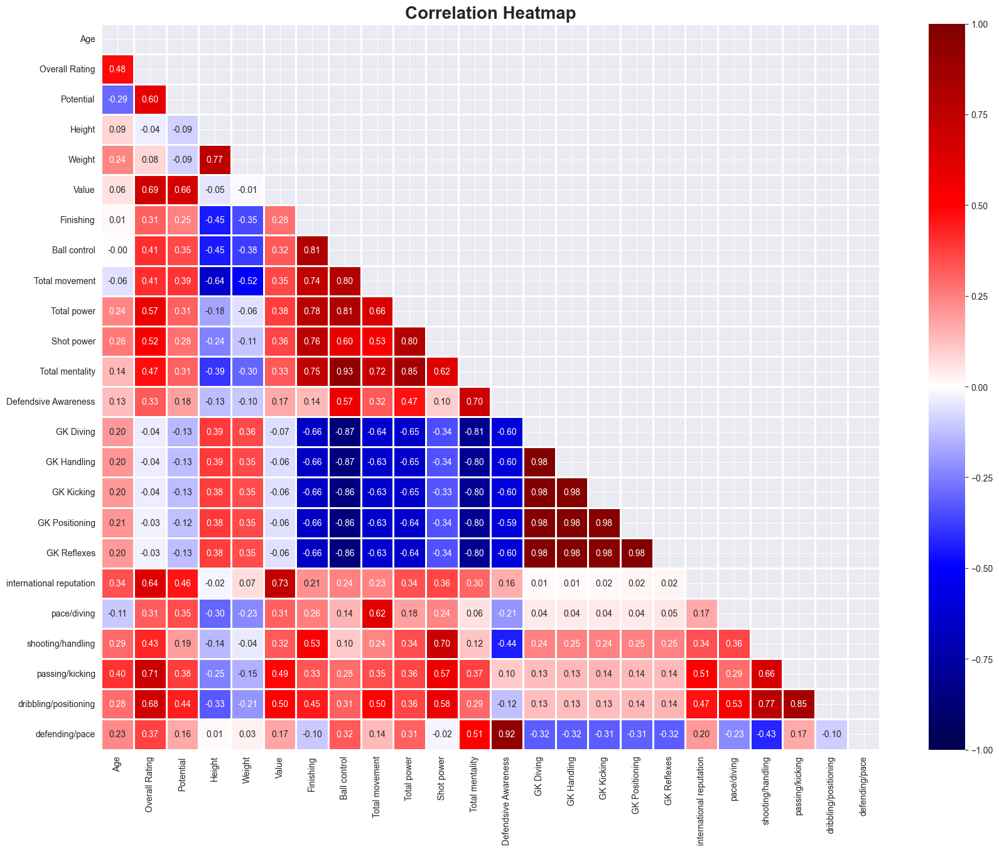

In [11]:
fig = plt.figure(figsize=[20,15])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)
#plt.savefig('heatmap1.png',transparent=True, bbox_inches='tight')

In [12]:
df = df.drop(['Height','Weight'],axis=1)

#['Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Total mentality', 'Shot power', 'Total power', 'Ball control', 'Finishing']

Text(0.5, 1.0, 'Correlation Heatmap')

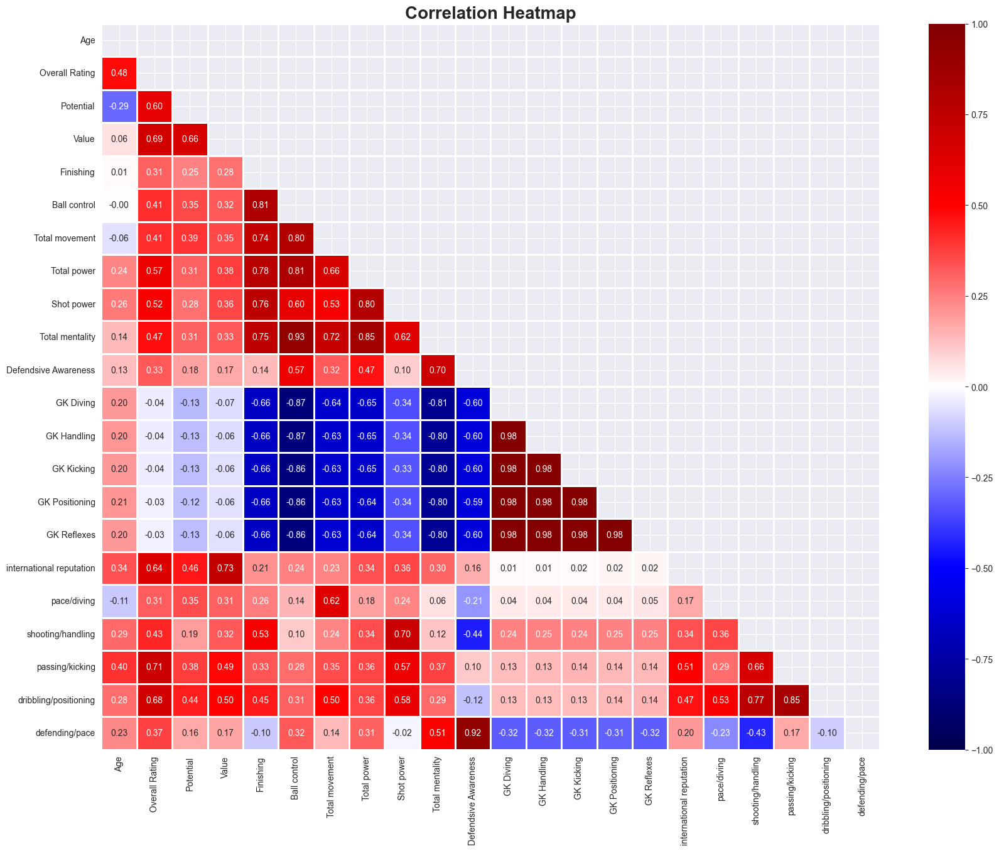

In [13]:

corr_matrix = df.corr()
fig = plt.figure(figsize=[20,15])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)
#plt.savefig('heatmap2.png',transparent=True, bbox_inches='tight')

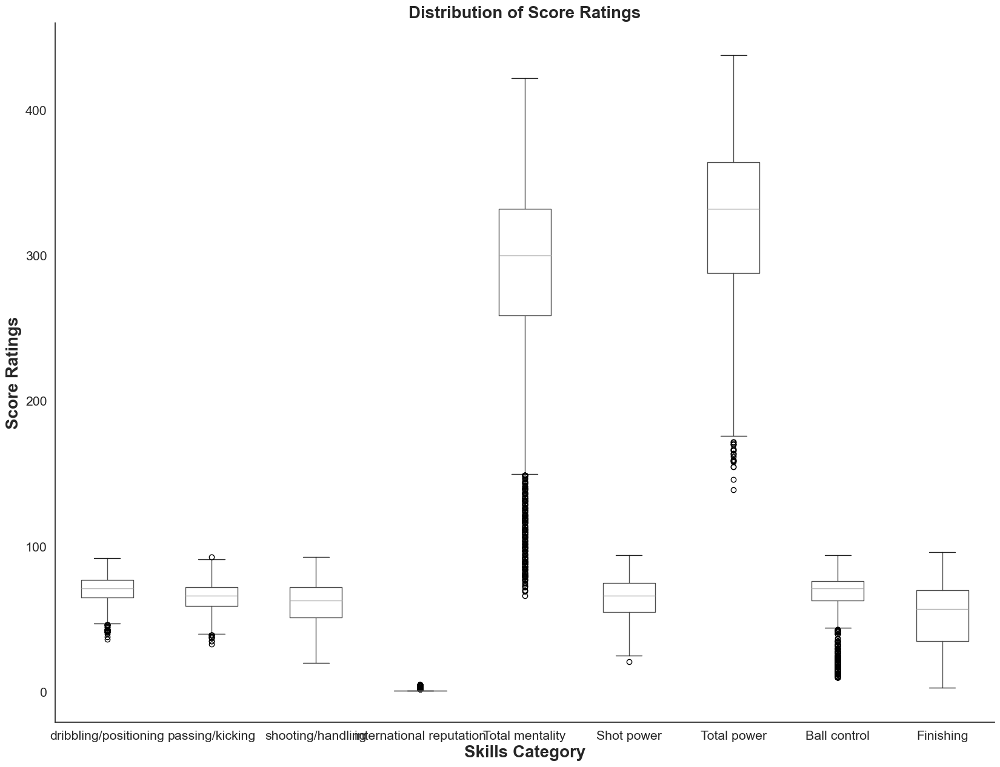

In [15]:
fig = plt.figure(figsize=[20,15])
sns.set(style='white', font_scale=1.4)
df[['dribbling/positioning','passing/kicking','shooting/handling','international reputation','Total mentality','Shot power','Total power','Ball control','Finishing']].boxplot()
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings', fontsize=20, weight='bold')
sns.despine()
# plt.savefig('boxplot.png', transparent=True, bbox_inches='tight')

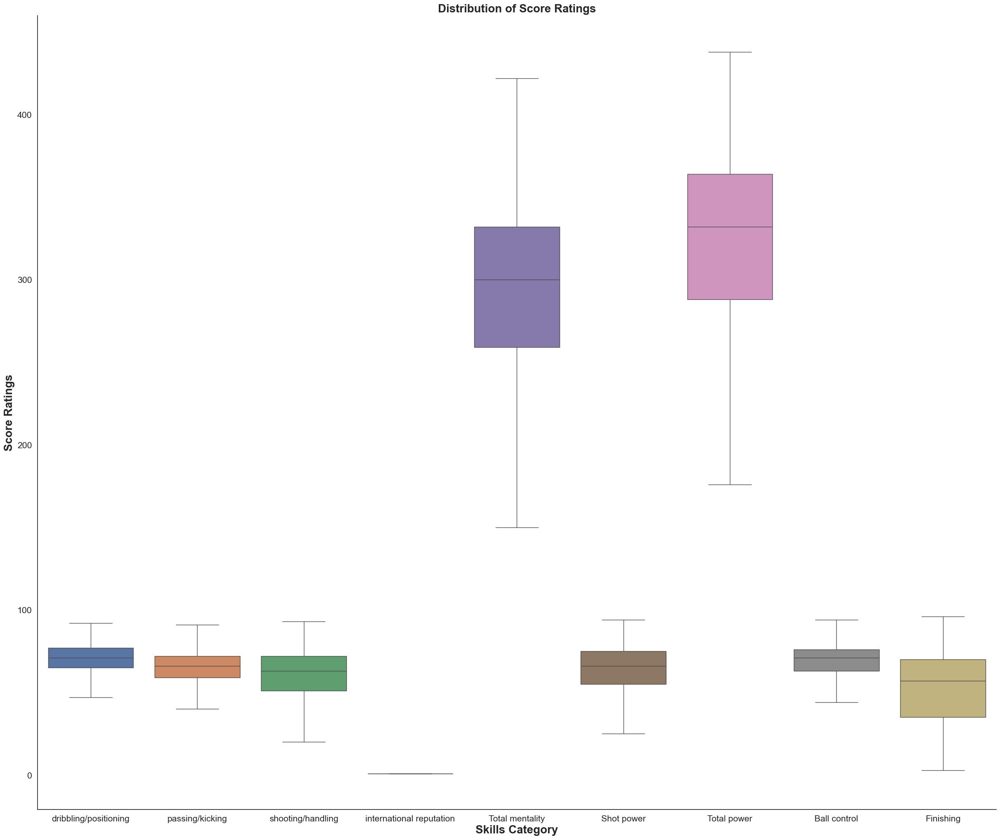

In [16]:
fig = plt.figure(figsize=[30,25])
sns.set(style='white', font_scale=1.4)
data = df[['dribbling/positioning','passing/kicking','shooting/handling','international reputation','Total mentality','Shot power','Total power','Ball control','Finishing']]
sns.boxplot(data=data, showfliers=False)
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings', fontsize=20, weight='bold')
sns.despine()
# plt.savefig('boxplot.png', transparent=True, bbox_inches='tight')

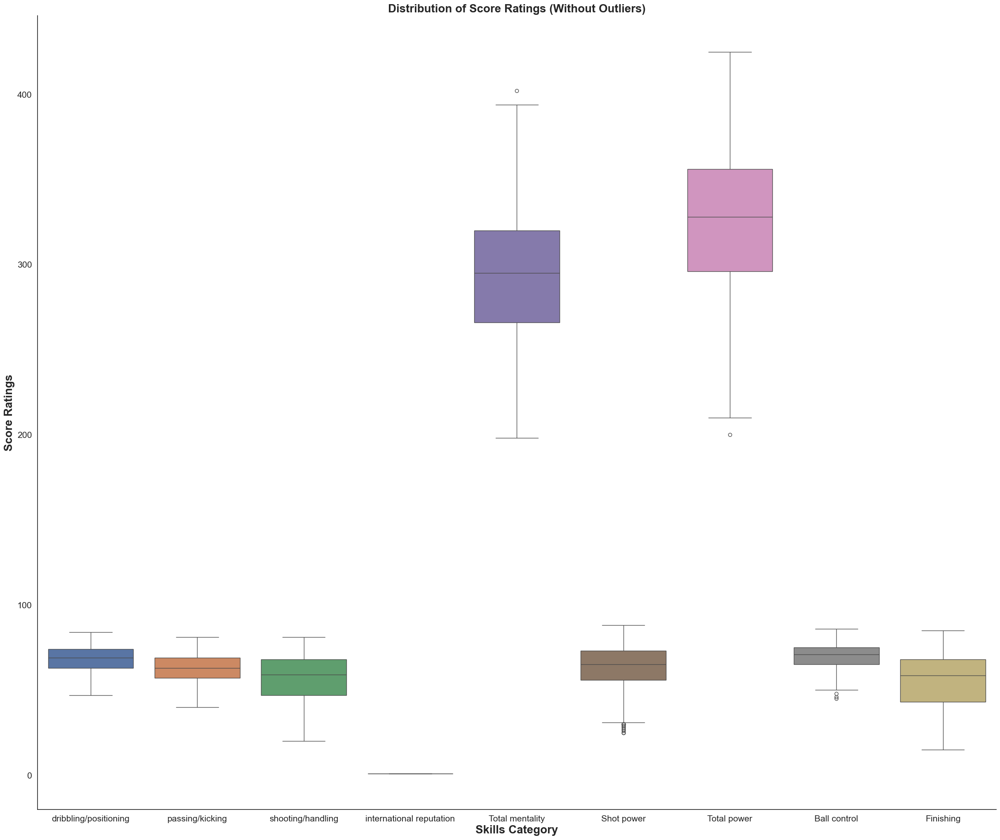

In [17]:
import numpy as np

# Calculate the IQR for each column
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

# Define the upper and lower bounds to identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out the outliers from the dataset
filtered_df = df[~((df < lower_bound) | (df > upper_bound)).any(axis=1)]

# Create the boxplot with the filtered dataset
fig = plt.figure(figsize=[30,25])
sns.set(style='white', font_scale=1.4)
data = filtered_df[['dribbling/positioning','passing/kicking','shooting/handling','international reputation','Total mentality','Shot power','Total power','Ball control','Finishing']]
sns.boxplot(data=data)
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings (Without Outliers)', fontsize=20, weight='bold')
sns.despine()

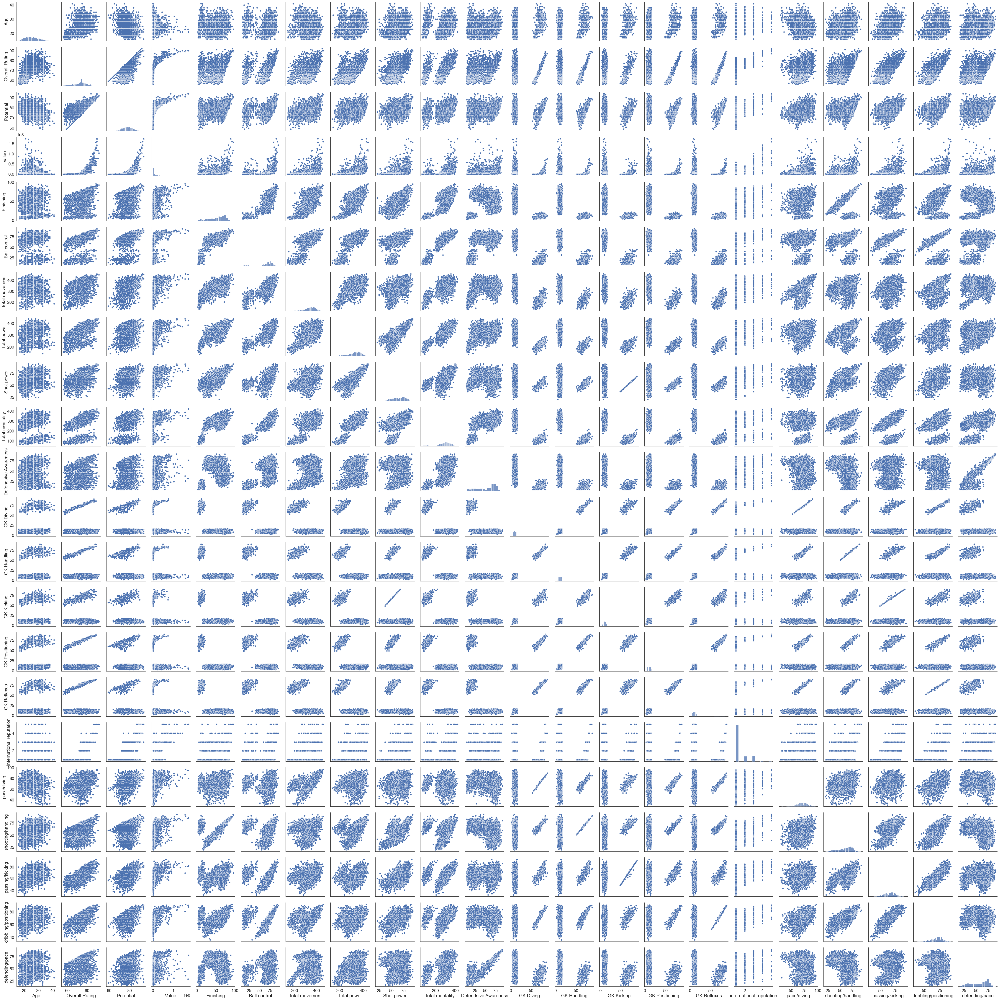

In [18]:
sns.set(style='white',font_scale=1.5)
sns.pairplot(df)
#plt.savefig('pairplot1.png',transparent=True, bbox_inches='tight'

In [23]:
selected_columns = ['Age','dribbling/positioning','passing/kicking','shooting/handling','international reputation', 'Total mentality', 'Shot power', 'Total power', 'Ball control', 'Finishing','Value']
new_df = df[selected_columns].copy()


In [24]:
new_df

,Age,dribbling/positioning,passing/kicking,shooting/handling,international reputation,Total mentality,Shot power,Total power,Ball control,Finishing,Value
0,32,89,85,88,5,382,83,409,90,93,104000000
1,28,84,86,80,5,391,92,438,90,74,115500000
2,32,72,72,60,5,354,81,402,77,52,77500000
3,23,81,70,92,5,390,94,438,83,96,157000000
4,30,83,83,93,5,396,94,431,87,95,117500000
...,...,...,...,...,...,...,...,...,...,...,...
2725,18,59,56,52,1,260,56,261,60,54,450000
2726,18,56,50,56,1,219,63,278,56,56,375000
2727,18,59,55,45,1,259,50,241,57,45,350000
2728,17,60,54,58,1,82,41,159,12,4,325000


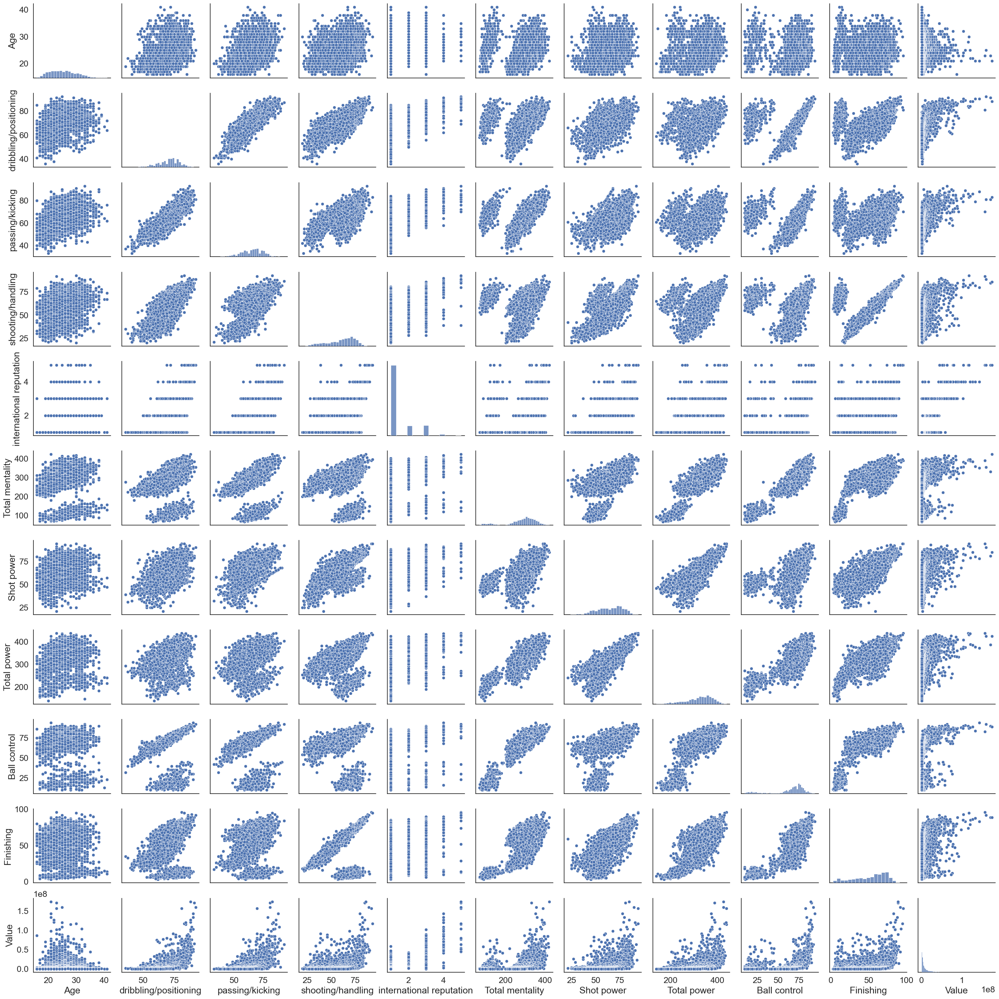

In [25]:
sns.set(style='white',font_scale=1.5)
sns.pairplot(new_df)

In [26]:
y, X = patsy.dmatrices("Q('Value') ~ Q('Age') + Q('dribbling/positioning') + Q('passing/kicking') + Q('shooting/handling') + Q('international reputation') + Q('Total mentality') + Q('Shot power') + Q('Total power') + Q('Ball control') + Q('Finishing')", data=new_df, return_type="dataframe")
model = sm.OLS(y, X)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Q('Value')   R-squared:                       0.654
Model:                            OLS   Adj. R-squared:                  0.653
Method:                 Least Squares   F-statistic:                     513.6
Date:                Mon, 17 Feb 2025   Prob (F-statistic):               0.00
Time:                        14:58:17   Log-Likelihood:                -47757.
No. Observations:                2729   AIC:                         9.554e+04
Df Residuals:                    2718   BIC:                         9.560e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                     -3.872e+07   2.09e+06    -18.548      0.000   -4.28e+07   -3.46e+07
Q('Age')                      -1.084e+06   4.92e+04    -22.036      0.000   -1.18e+06   -9.88e+05
Q('dribbling/positioning')     3.399e+05   5.82e+04      5.837      0.000    2.26e+05    4.54e+05
Q('passing/kicking')           2.114e+05   5.11e+04      4.139      0.000    1.11e+05    3.12e+05
Q('shooting/handling')         5.989e+04   6.39e+04      0.937      0.349   -6.55e+04    1.85e+05
Q('international reputation')  1.335e+07   2.87e+05     46.485      0.000    1.28e+07    1.39e+07
Q('Total mentality')          -3.063e+04   9435.036     -3.247      0.001   -4.91e+04   -1.21e+04
Q('Shot power')               -2.147e+05   3.91e+04     -5.490      0.000   -2.91e+05   -1.38e+05
Q('Total power')               1.226e+05   9242.727     13.262      0.000    1.04e+05    1.41e+05
Q('Ball control')              1.003e+05   5.08e+04      1.976      0.048     789.490       2e+05
Q('Finishing')                -1.418e+05   3.99e+04     -3.557      0.000    -2.2e+05   -6.36e+04
==============================================================================
Omnibus:                     1829.778   Durbin-Watson:                   1.410
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            52957.283
Skew:                           2.747   Prob(JB):                         0.00
Kurtosis:                      23.870   Cond. No.                     5.26e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.26e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [27]:
df1 = new_df.copy()

In [28]:

mask = new_df['Value'] > 0  # Create a boolean mask for non-zero values
df1['Value'] = np.log(new_df.loc[mask, 'Value'])  # Apply log only to non-zero values

In [29]:

df1 = df1.rename(columns={'Value':'Log Market Value'})

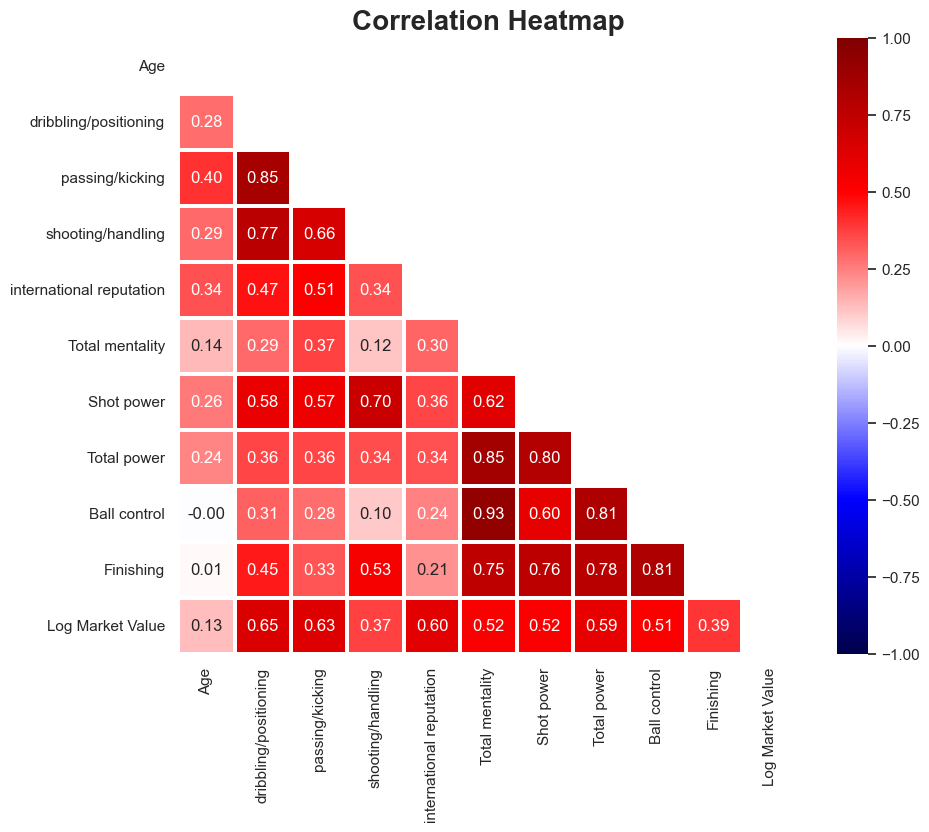

In [30]:
sns.set(font_scale=1,style='white')
corr_matrix = df1.corr()
fig = plt.figure(figsize=[10,8])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1.5,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)

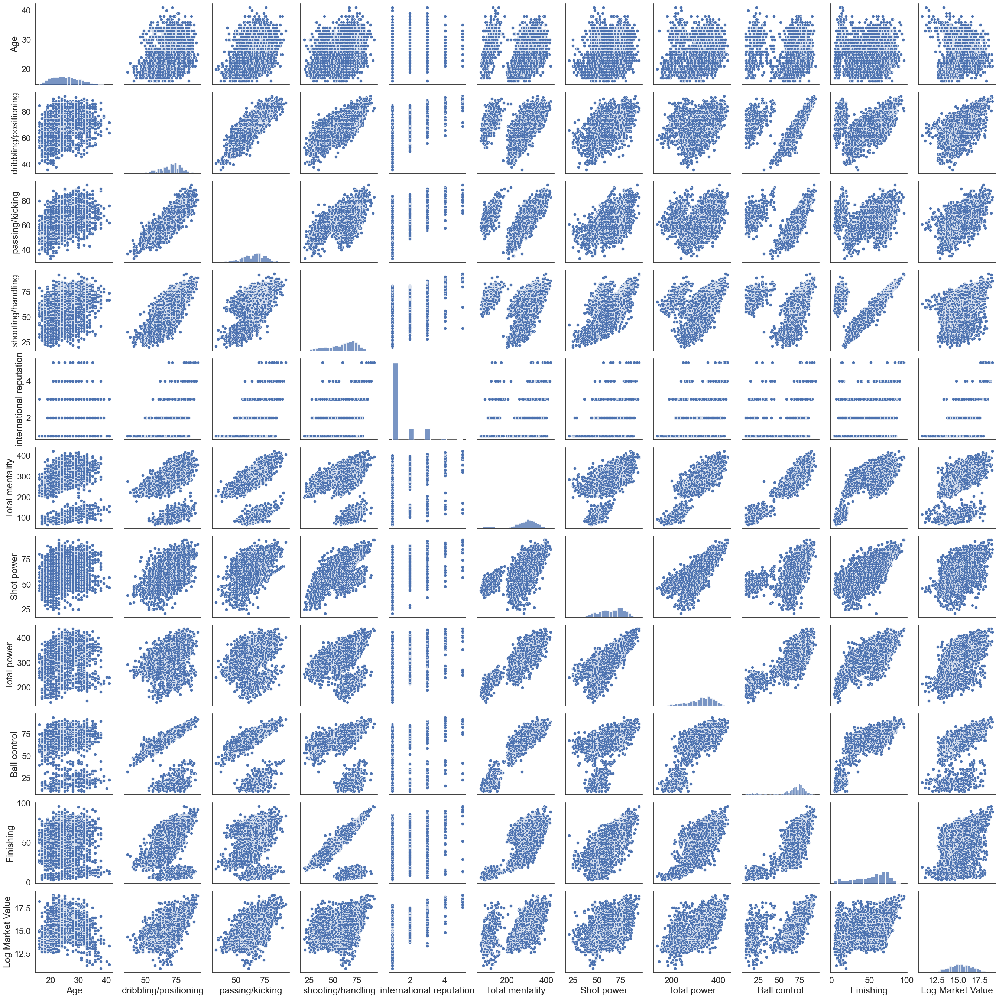

In [31]:
sns.set(style='white', font_scale=1.5)
sns.pairplot(df1)

In [33]:
y, X = patsy.dmatrices("Q('Log Market Value') ~ Q('Age') + Q('dribbling/positioning') + Q('passing/kicking') + Q('shooting/handling') + Q('international reputation') + Q('Total mentality') + Q('Shot power') + Q('Total power') + Q('Ball control') + Q('Finishing')", data=df1, return_type="dataframe")

model = sm.OLS(y, X)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Q('Log Market Value')   R-squared:                       0.756
Model:                               OLS   Adj. R-squared:                  0.755
Method:                    Least Squares   F-statistic:                     842.9
Date:                   Mon, 17 Feb 2025   Prob (F-statistic):               0.00
Time:                           15:01:24   Log-Likelihood:                -2729.0
No. Observations:                   2729   AIC:                             5480.
Df Residuals:                       2718   BIC:                             5545.
Df Model:                             10                                         
Covariance Type:               nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                         6.6899      0.142     46.947      0.000       6.410       6.969
Q('Age')                         -0.0769      0.003    -22.888      0.000      -0.083      -0.070
Q('dribbling/positioning')        0.0618      0.004     15.537      0.000       0.054       0.070
Q('passing/kicking')              0.0207      0.003      5.922      0.000       0.014       0.027
Q('shooting/handling')            0.0104      0.004      2.376      0.018       0.002       0.019
Q('international reputation')     0.4780      0.020     24.381      0.000       0.440       0.516
Q('Total mentality')             -0.0014      0.001     -2.225      0.026      -0.003      -0.000
Q('Shot power')                  -0.0195      0.003     -7.293      0.000      -0.025      -0.014
Q('Total power')                  0.0167      0.001     26.408      0.000       0.015       0.018
Q('Ball control')                 0.0259      0.003      7.465      0.000       0.019       0.033
Q('Finishing')                   -0.0353      0.003    -12.984      0.000      -0.041      -0.030
==============================================================================
Omnibus:                       57.726   Durbin-Watson:                   1.505
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               65.223
Skew:                           0.314   Prob(JB):                     6.87e-15
Kurtosis:                       3.424   Cond. No.                     5.26e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.26e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [34]:
def diagnostic_plot(x, y):
    plt.figure(figsize=(20,5))

    rgr = LinearRegression()
    rgr.fit(x,y)
    pred = rgr.predict(x)

    plt.subplot(1, 3, 1)
    plt.scatter(pred,y,alpha=0.1)
    plt.plot(y, y, color='red',linewidth=1,)
    plt.title("Regression fit")
    plt.xlabel("Predicted y")
    plt.ylabel("y")

    plt.subplot(1, 3, 2)
    res = y - pred
    plt.scatter(pred, res,alpha=0.1)
    plt.title("Residual plot")
    plt.xlabel("prediction")
    plt.ylabel("residuals")

    print(res)

    plt.subplot(1, 3, 3)
    #Generates a probability plot of sample data against the quantiles of a
    # specified theoretical distribution
    stats.probplot(res, dist="norm", plot=plt,)
    plt.title("Normal Q-Q plot")

In [37]:
y = df1['Log Market Value']
X = df1.drop(['Log Market Value'],axis=1)

In [38]:
y

0       18.459901
1       18.564781
2       18.165788
3       18.871756
4       18.581949
          ...    
2725    13.017003
2726    12.834681
2727    12.765688
2728    12.691580
2729    12.691580
Name: Log Market Value, Length: 2729, dtype: float64

0      -0.020115
1      -0.818103
2       0.219763
3       0.491824
4       0.324120
          ...   
2725   -0.637934
2726   -0.584171
2727   -0.821381
2728   -0.495656
2729   -0.409559
Name: Log Market Value, Length: 2729, dtype: float64


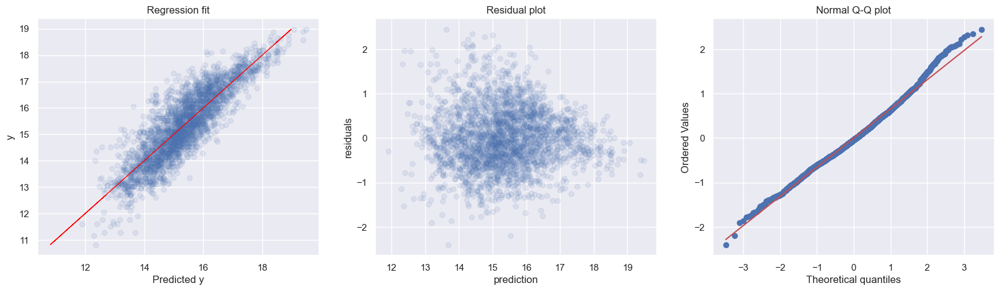

In [39]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer

# Remove rows with missing values from X and y
combined_df = pd.concat([X, y], axis=1)
combined_df.dropna(inplace=True)

# Separate X and y after removing missing values
X = combined_df.iloc[:, :-1]
y = combined_df.iloc[:, -1]

# Use the diagnostic_plot() function with the updated X and y
sns.set(style='darkgrid')
diagnostic_plot(X, y)

<Figure size 600x600 with 0 Axes>

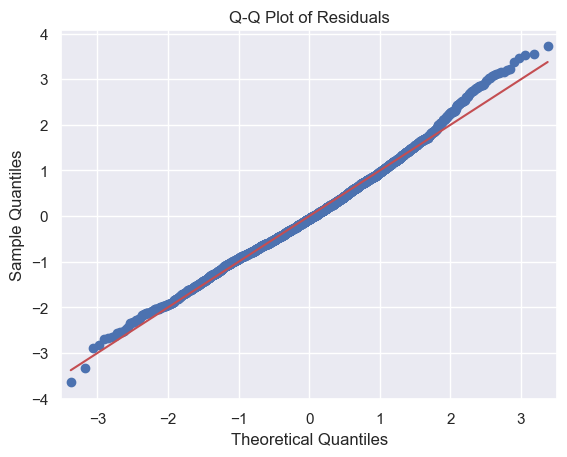


### Kiểm định mô hình ###
Ramsey RESET Test (p-value): 0.0003
Durbin-Watson Stat: 1.5046
Breusch-Godfrey Test (p-value): 0.0000
Skewness: 0.3137
Kurtosis: 0.4242

### Kiểm tra đa cộng tuyến (VIF) ###
                    Feature         VIF
0                       Age   43.562705
1     dribbling/positioning  426.587083
2           passing/kicking  334.747779
3         shooting/handling  457.547878
4  international reputation    5.390466
5           Total mentality  219.549775
6                Shot power  193.224119
7               Total power  225.639242
8              Ball control  350.638435
9                 Finishing  143.554509


In [45]:
# Import thư viện cần thiết
import statsmodels.api as sm
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
from statsmodels.stats.diagnostic import linear_reset, het_breuschpagan, acorr_breusch_godfrey
from statsmodels.stats.stattools import durbin_watson
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Kiểm định Ramsey RESET (Kiểm tra thiếu biến)
reset_pval = linear_reset(fit, power=2, use_f=True).pvalue

# Kiểm định Durbin-Watson (Tự tương quan phần dư)
dw_stat = durbin_watson(fit.resid)

# Kiểm định Breusch-Godfrey (Tự tương quan bậc cao)
bg_pval = acorr_breusch_godfrey(fit, nlags=2)[1]

# Kiểm tra đa cộng tuyến (VIF)
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Kiểm tra Skewness & Kurtosis (Phân phối chuẩn của phần dư)
skewness = stats.skew(fit.resid)
kurtosis = stats.kurtosis(fit.resid, fisher=True)

# Vẽ Q-Q Plot để kiểm tra trực quan tính chuẩn của phần dư
plt.figure(figsize=(6, 6))
sm.qqplot(fit.resid, line='s', fit=True)
plt.title("Q-Q Plot of Residuals")
plt.show()

# Hiển thị kết quả kiểm định
results = {
    "Ramsey RESET Test (p-value)": reset_pval,
    "Durbin-Watson Stat": dw_stat,
    "Breusch-Godfrey Test (p-value)": bg_pval,
    "Skewness": skewness,
    "Kurtosis": kurtosis
}

# In kết quả
print("\n### Kiểm định mô hình ###")
for test, value in results.items():
    print(f"{test}: {value:.4f}")

print("\n### Kiểm tra đa cộng tuyến (VIF) ###")
print(vif_data)
